In [2]:
import os
import cv2
import numpy as np
from scipy.signal import wiener
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import imutils
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from datetime import datetime
import tensorflow as tf
import matplotlib.pyplot as plt

2025-05-27 04:46:06.055048: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748321166.249902      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748321166.302181      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# ------------------------------------------
# Enhancement Functions
# ------------------------------------------

def apply_wiener_filter(img):
    # Replaced with soft denoising
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    denoised = cv2.fastNlMeansDenoising(gray, h=10)
    return cv2.merge([denoised] * 3)


def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    # Reduced clipLimit and increased tileGridSize for more localized and softer enhancement
    clahe = cv2.createCLAHE(clipLimit=1.75, tileGridSize=(16, 16))
    cl = clahe.apply(l)
    merged = cv2.merge((cl, a, b))
    return cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)

def normalize_image(img):
    return img.astype('float32') / 255.0

def crop_brain_region(img, mask=None, margin=0):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    thresh = cv2.threshold(blurred, 45, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=2)

    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    if not cnts:
        return img, mask if mask is not None else img

    x, y, w, h = cv2.boundingRect(max(cnts, key=cv2.contourArea))
    x = max(x - margin, 0)
    y = max(y - margin, 0)
    w = min(w + 2 * margin, img.shape[1] - x)
    h = min(h + 2 * margin, img.shape[0] - y)

    img_cropped = img[y:y+h, x:x+w]
    if mask is not None:
        if len(mask.shape) == 2:
            mask = mask[..., np.newaxis]
        mask_cropped = mask[y:y+h, x:x+w]
        return img_cropped, mask_cropped
    return img_cropped, None

# ------------------------------------------
# Load and Preprocess Dataset
# ------------------------------------------

def load_data(base_path, target_size=(128, 128)):
    images, masks = [], []
    for label in range(4):  # 0: No Tumor, 1: Glioma, 2: Meningioma, 3: Pituitary
        image_folder = os.path.join(base_path, 'image', str(label))
        mask_folder = os.path.join(base_path, 'mask', str(label))

        for file_name in os.listdir(image_folder):
            img_path = os.path.join(image_folder, file_name)
            file_root, _ = os.path.splitext(file_name)
            mask_path = os.path.join(mask_folder, file_root + '_m.jpg')

            if not os.path.exists(mask_path):
                continue

            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if img is None or mask is None:
                continue
            if np.max(mask) == 0:
                continue

            img, mask = crop_brain_region(img, mask)
            if img is None or img.size == 0 or mask is None or mask.size == 0:
                continue

            img = cv2.resize(img, target_size)
            mask = cv2.resize(mask, target_size)

            img = apply_wiener_filter(img)
            img = apply_clahe(img)
            img = normalize_image(img)

            mask = (mask > 0).astype(np.float32)[..., np.newaxis]

            images.append(img)
            masks.append(mask)

    return np.array(images), np.array(masks)

# ------------------------------------------
# TensorFlow Augmentation Dataset Generator
# ------------------------------------------

def create_tf_dataset(X, Y, batch_size=16, augment=True, brightness_delta=0.05):
    def preprocess(image, mask):
        image = tf.cast(image, tf.float32)
        mask = tf.cast(mask, tf.float32)

        if augment:
            flip = tf.random.uniform([]) > 0.5
            image = tf.cond(flip, lambda: tf.image.flip_left_right(image), lambda: image)
            mask = tf.cond(flip, lambda: tf.image.flip_left_right(mask), lambda: mask)
            image = tf.image.random_brightness(image, max_delta=brightness_delta)

        image = tf.clip_by_value(image, 0.0, 1.0)
        mask = tf.clip_by_value(mask, 0.0, 1.0)

        return image, mask

    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    dataset = dataset.shuffle(buffer_size=len(X), seed=42)
    dataset = dataset.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


In [4]:
def load_unseen_dataset(base_dir, target_size=(128, 128), return_labels=True):
    images = []
    labels = []
    file_paths = []
    label_map = {'notumor': 0, 'glioma': 1, 'meningioma': 2, 'pituitary': 3}

    for class_name in os.listdir(base_dir):
        class_dir = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        for file_name in sorted(os.listdir(class_dir)):
            img_path = os.path.join(class_dir, file_name)

            img = cv2.imread(img_path)
            if img is None:
                continue

            # Save path for later reference
            file_paths.append(img_path)

            # Preprocess image
            img, _ = crop_brain_region(img)
            if img is None or img.size == 0:
                continue

            img = cv2.resize(img, target_size)
            img = apply_wiener_filter(img)
            img = apply_clahe(img)
            img = normalize_image(img)

            images.append(img)
            if return_labels:
                labels.append(label_map[class_name.lower()])

    if return_labels:
        return np.array(images), np.array(labels), file_paths
    return np.array(images), file_paths


In [5]:
# Load test data (e.g., for classification or evaluation)
test_dir = "/kaggle/input/brain-tumor-mri-dataset/Training"
X_test, y_test, test_paths = load_unseen_dataset(test_dir)

In [6]:
# Load test data (e.g., for classification or evaluation)
test_dir1 = "/kaggle/input/brain-tumor-mri-dataset/Testing"
X_test1, y_test1, test_paths1 = load_unseen_dataset(test_dir1)

In [7]:
def plot_unseen_comparison(base_dir, indices=None, target_size=(256, 256), max_samples=5):
    """
    Compare original and preprocessed images from unseen classification dataset.
    
    Parameters:
        base_dir (str): Path to unseen dataset (e.g., "/kaggle/input/brain-tumor-mri-dataset/Training")
        indices (list): Optional list of global sample indices to plot
        target_size (tuple): Final size after preprocessing
        max_samples (int): Number of random samples to show if indices is None
    """
    import matplotlib.pyplot as plt

    # Prepare list of (image_path, class_name)
    image_list = []
    for class_name in sorted(os.listdir(base_dir)):
        class_path = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_path): continue

        for img_name in sorted(os.listdir(class_path)):
            image_list.append((os.path.join(class_path, img_name), class_name))

    # Choose samples
    if indices is None:
        indices = np.random.choice(len(image_list), size=min(max_samples, len(image_list)), replace=False)

    for i in indices:
        img_path, label = image_list[i]
        original = cv2.imread(img_path)

        if original is None:
            print(f"[SKIPPED] Failed to read {img_path}")
            continue

        # Apply preprocessing
        processed, _ = crop_brain_region(original.copy())
        if processed is None or processed.size == 0:
            print(f"[SKIPPED] Failed to crop {img_path}")
            continue

        processed = cv2.resize(processed, target_size)
        processed = apply_wiener_filter(processed)
        processed = apply_clahe(processed)
        processed = normalize_image(processed)

        # Plot comparison
        plt.figure(figsize=(8, 4))
        
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.title(f"{label} - Original")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(processed)
        plt.title(f"{label} - Preprocessed")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

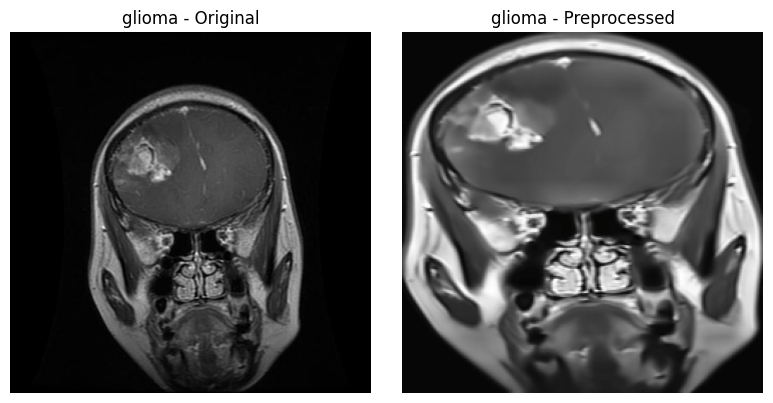

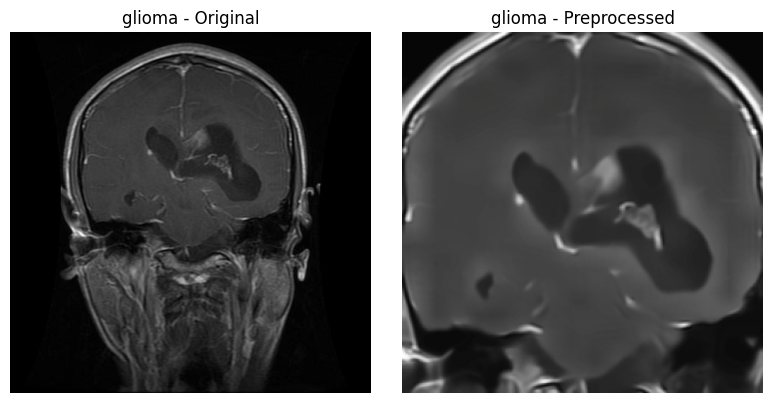

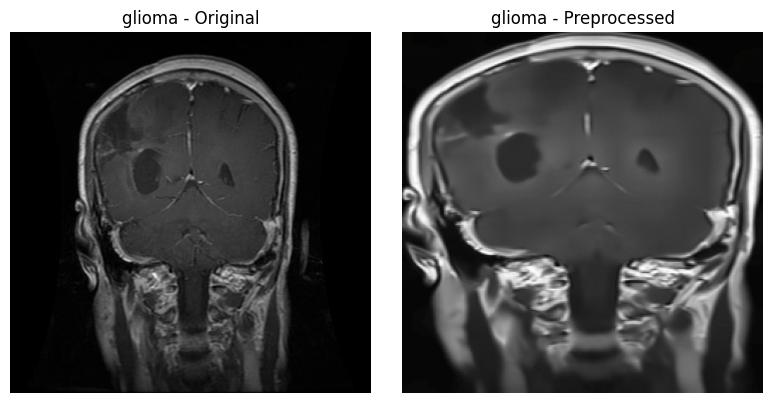

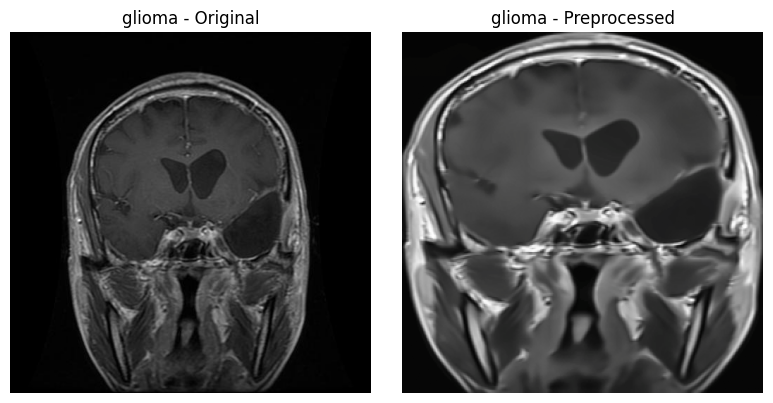

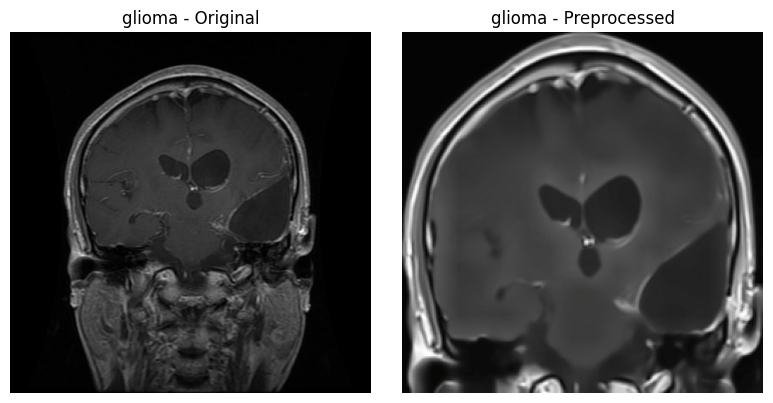

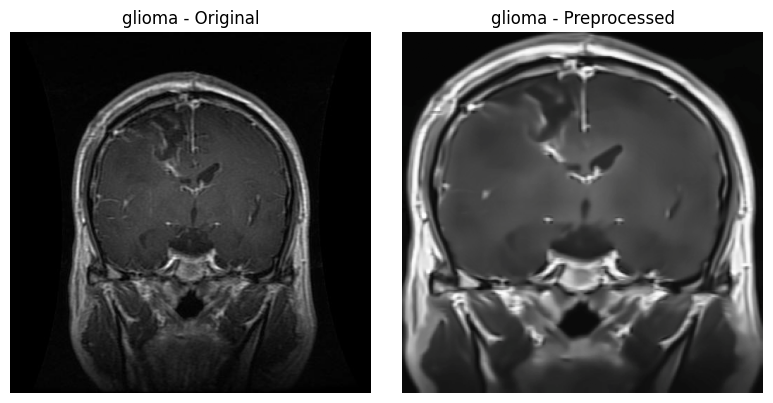

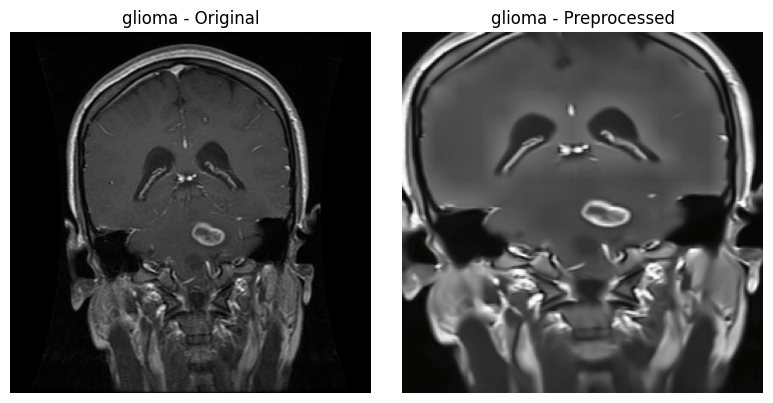

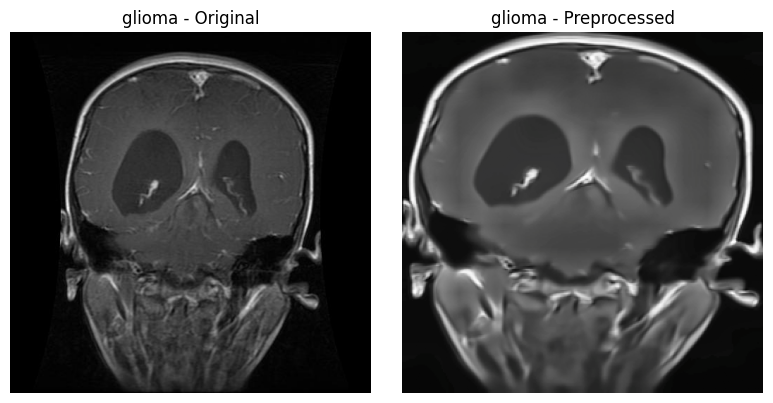

In [8]:
plot_unseen_comparison("/kaggle/input/brain-tumor-mri-dataset/Training", indices=[0, 4, 10, 11, 12, 13, 14, 15])

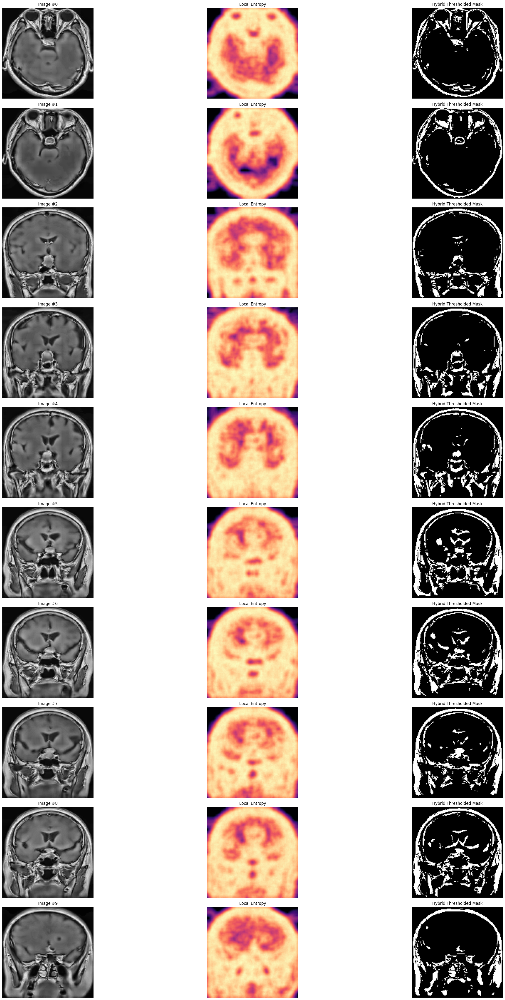

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_multiotsu, rank
from skimage.morphology import disk
from skimage.util import img_as_ubyte

# Load the sample set again
sample_images = X_test[:10]

def compute_entropy_mask(gray_img, disk_size=5, entropy_thresh=4.5):
    """Generate a high-entropy region mask"""
    entropy_img = rank.entropy(gray_img, disk(disk_size))
    norm_entropy = entropy_img / np.max(entropy_img)
    binary_entropy_mask = (norm_entropy > (entropy_thresh / 8.0)).astype(np.uint8) * 255
    return entropy_img, binary_entropy_mask

def hybrid_entropy_multiotsu(image):
    """Hybrid segmentation using entropy and Multi-Otsu refinement"""
    gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    
    # Step 1: Entropy
    entropy_map, entropy_mask = compute_entropy_mask(gray)

    # Step 2: Multi-Otsu
    thresholds = threshold_multiotsu(gray, classes=3)
    regions = np.digitize(gray, bins=thresholds)
    tumor_region = (regions == regions.max()).astype(np.uint8) * 255

    # Step 3: Combine both
    refined_mask = cv2.bitwise_and(tumor_region, entropy_mask)

    return gray, entropy_map, refined_mask

# Run hybrid segmentation
results = [hybrid_entropy_multiotsu(img) for img in sample_images]

# Plot
fig, axes = plt.subplots(len(results), 3, figsize=(30, 42))
for i, (gray, entropy_map, refined_mask) in enumerate(results):
    axes[i, 0].imshow(gray, cmap='gray')
    axes[i, 0].set_title(f"Image #{i}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(entropy_map, cmap='magma')
    axes[i, 1].set_title("Local Entropy")
    axes[i, 1].axis('off')

    axes[i, 2].imshow(refined_mask, cmap='gray')
    axes[i, 2].set_title("Hybrid Thresholded Mask")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


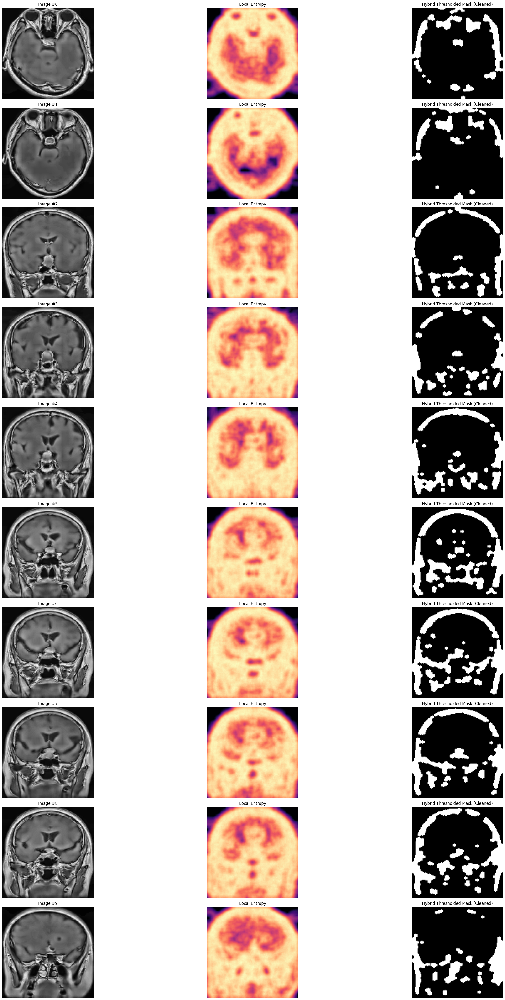

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_multiotsu, rank
from skimage.morphology import disk
from skimage.util import img_as_ubyte

# Load the sample set again
sample_images = X_test[:10]

def compute_entropy_mask(gray_img, disk_size=5, entropy_thresh=4.5):
    """Generate a high-entropy region mask"""
    entropy_img = rank.entropy(gray_img, disk(disk_size))
    norm_entropy = entropy_img / np.max(entropy_img)
    binary_entropy_mask = (norm_entropy > (entropy_thresh / 8.0)).astype(np.uint8) * 255
    return entropy_img, binary_entropy_mask

def clean_mask(mask, kernel_size=5):
    """
    Applies morphological cleanup to the binary mask.
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)
    return (opened > 127).astype(np.uint8) * 255

def hybrid_entropy_multiotsu(image):
    """Hybrid segmentation using entropy and Multi-Otsu refinement"""
    gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

    # Step 1: Entropy-based mask
    entropy_map, entropy_mask = compute_entropy_mask(gray)

    # Step 2: Multi-Otsu segmentation
    thresholds = threshold_multiotsu(gray, classes=3)
    regions = np.digitize(gray, bins=thresholds)
    tumor_region = (regions == regions.max()).astype(np.uint8) * 255

    # Step 3: Combine both
    combined_mask = cv2.bitwise_and(tumor_region, entropy_mask)

    # Step 4: Morphological cleanup
    cleaned_mask = clean_mask(combined_mask)

    return gray, entropy_map, cleaned_mask

# Run hybrid segmentation
results = [hybrid_entropy_multiotsu(img) for img in sample_images]

# Plot results
fig, axes = plt.subplots(len(results), 3, figsize=(30, 42))
for i, (gray, entropy_map, cleaned_mask) in enumerate(results):
    axes[i, 0].imshow(gray, cmap='gray')
    axes[i, 0].set_title(f"Image #{i}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(entropy_map, cmap='magma')
    axes[i, 1].set_title("Local Entropy")
    axes[i, 1].axis('off')

    axes[i, 2].imshow(cleaned_mask, cmap='gray')
    axes[i, 2].set_title("Hybrid Thresholded Mask (Cleaned)")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


In [25]:
import os
import cv2
import numpy as np
from skimage.filters import threshold_multiotsu, rank
from skimage.morphology import disk
from skimage.util import img_as_ubyte

# Ensure these are all aligned: X_test, y_test, test_paths
assert len(X_test) == len(y_test) == len(test_paths)

# Label map
label_map = {0: "notumor", 1: "glioma", 2: "meningioma", 3: "pituitary"}

# Base directory to save
save_dir = "/kaggle/working/predicted_masks/Training"
os.makedirs(save_dir, exist_ok=True)

def compute_entropy_mask(gray_img, disk_size=5, entropy_thresh=4.5):
    entropy_img = rank.entropy(gray_img, disk(disk_size))
    norm_entropy = entropy_img / np.max(entropy_img)
    binary_entropy_mask = (norm_entropy > (entropy_thresh / 8.0)).astype(np.uint8) * 255
    return entropy_img, binary_entropy_mask

def clean_mask(mask, kernel_size=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)
    return (opened > 127).astype(np.uint8) * 255

def hybrid_entropy_multiotsu(image):
    gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    entropy_map, entropy_mask = compute_entropy_mask(gray)
    thresholds = threshold_multiotsu(gray, classes=3)
    regions = np.digitize(gray, bins=thresholds)
    tumor_region = (regions == regions.max()).astype(np.uint8) * 255
    combined_mask = cv2.bitwise_and(tumor_region, entropy_mask)
    cleaned_mask = clean_mask(combined_mask)
    return cleaned_mask

# Saving loop using original filenames
for i in range(len(X_test)):
    image = X_test[i]
    label = y_test[i]
    class_name = label_map[label]

    # Create class directory
    class_dir = os.path.join(save_dir, class_name)
    os.makedirs(class_dir, exist_ok=True)

    # Extract base filename from original path
    original_path = test_paths[i]
    base_name = os.path.splitext(os.path.basename(original_path))[0]

    # Run segmentation
    mask = hybrid_entropy_multiotsu(image)

    # Save with original base name + "_m.jpg"
    save_path = os.path.join(class_dir, f"{base_name}_m.jpg")
    cv2.imwrite(save_path, mask)

In [26]:
import os
import cv2
import numpy as np
from skimage.filters import threshold_multiotsu, rank
from skimage.morphology import disk
from skimage.util import img_as_ubyte

# Ensure these are all aligned: X_test, y_test, test_paths
assert len(X_test1) == len(y_test1) == len(test_paths1)

# Label map
label_map = {0: "notumor", 1: "glioma", 2: "meningioma", 3: "pituitary"}

# Base directory to save
save_dir = "/kaggle/working/predicted_masks/Testing"
os.makedirs(save_dir, exist_ok=True)

def compute_entropy_mask(gray_img, disk_size=5, entropy_thresh=4.5):
    entropy_img = rank.entropy(gray_img, disk(disk_size))
    norm_entropy = entropy_img / np.max(entropy_img)
    binary_entropy_mask = (norm_entropy > (entropy_thresh / 8.0)).astype(np.uint8) * 255
    return entropy_img, binary_entropy_mask

def clean_mask(mask, kernel_size=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)
    return (opened > 127).astype(np.uint8) * 255

def hybrid_entropy_multiotsu(image):
    gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    entropy_map, entropy_mask = compute_entropy_mask(gray)
    thresholds = threshold_multiotsu(gray, classes=3)
    regions = np.digitize(gray, bins=thresholds)
    tumor_region = (regions == regions.max()).astype(np.uint8) * 255
    combined_mask = cv2.bitwise_and(tumor_region, entropy_mask)
    cleaned_mask = clean_mask(combined_mask)
    return cleaned_mask

# Saving loop using original filenames
for i in range(len(X_test1)):
    image = X_test1[i]
    label = y_test1[i]
    class_name = label_map[label]

    # Create class directory
    class_dir = os.path.join(save_dir, class_name)
    os.makedirs(class_dir, exist_ok=True)

    # Extract base filename from original path
    original_path = test_paths1[i]
    base_name = os.path.splitext(os.path.basename(original_path))[0]

    # Run segmentation
    mask = hybrid_entropy_multiotsu(image)

    # Save with original base name + "_m.jpg"
    save_path = os.path.join(class_dir, f"{base_name}_m.jpg")
    cv2.imwrite(save_path, mask)

In [27]:
import shutil

# Source directory
src_dir = "/kaggle/working/predicted_masks"

# Destination zip file path (without extension)
zip_path = "/kaggle/working/predicted_masks"

# Create zip archive
shutil.make_archive(zip_path, 'zip', src_dir)


'/kaggle/working/predicted_masks.zip'